# EDA 

This notebook is for data cleaning and EDA on the dataset. 

We're using the California Fire Incidents dataset from Kaggle which contains records from 2013-2020 on wildfires in CA. 

In [7]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import datetime
import seaborn as sns
import altair as alt
import os

In [9]:
data = pd.read_csv("California_Fire_Incidents.csv")

In [5]:
data.head()

,AcresBurned,Active,AdminUnit,AirTankers,ArchiveYear,CalFireIncident,CanonicalUrl,ConditionStatement,ControlStatement,Counties,...,SearchKeywords,Started,Status,StructuresDamaged,StructuresDestroyed,StructuresEvacuated,StructuresThreatened,UniqueId,Updated,WaterTenders
0,257314.0,False,Stanislaus National Forest/Yosemite National Park,NaN,2013,True,/incidents/2013/8/17/rim-fire/,NaN,NaN,Tuolumne,...,"Rim Fire, Stanislaus National Forest, Yosemite...",2013-08-17T15:25:00Z,Finalized,NaN,NaN,NaN,NaN,5fb18d4d-213f-4d83-a179-daaf11939e78,2013-09-06T18:30:00Z,NaN
1,30274.0,False,USFS Angeles National Forest/Los Angeles Count...,NaN,2013,True,/incidents/2013/5/30/powerhouse-fire/,NaN,NaN,Los Angeles,...,"Powerhouse Fire, May 2013, June 2013, Angeles ...",2013-05-30T15:28:00Z,Finalized,NaN,NaN,NaN,NaN,bf37805e-1cc2-4208-9972-753e47874c87,2013-06-08T18:30:00Z,NaN
2,27531.0,False,CAL FIRE Riverside Unit / San Bernardino Natio...,NaN,2013,True,/incidents/2013/7/15/mountain-fire/,NaN,NaN,Riverside,...,"Mountain Fire, July 2013, Highway 243, Highway...",2013-07-15T13:43:00Z,Finalized,NaN,NaN,NaN,NaN,a3149fec-4d48-427c-8b2c-59e8b79d59db,2013-07-30T18:00:00Z,NaN
3,27440.0,False,Tahoe National Forest,NaN,2013,False,/incidents/2013/8/10/american-fire/,NaN,NaN,Placer,...,"American Fire, August 2013, Deadwood Ridge, Fo...",2013-08-10T16:30:00Z,Finalized,NaN,NaN,NaN,NaN,8213f5c7-34fa-403b-a4bc-da2ace6e6625,2013-08-30T08:00:00Z,NaN
4,24251.0,False,Ventura County Fire/CAL FIRE,NaN,2013,True,/incidents/2013/5/2/springs-fire/,Acreage has been reduced based upon more accur...,NaN,Ventura,...,"Springs Fire, May 2013, Highway 101, Camarillo...",2013-05-02T07:01:00Z,Finalized,6.0,10.0,NaN,NaN,46731fb8-3350-4920-bdf7-910ac0eb715c,2013-05-11T06:30:00Z,11.0


In [6]:
data.shape

(1636, 40)

# Initial Hypotheses

### 1. Start Month is correlated positively with number of fires with summer months containing the most number of fires
    - Global Warming
    - Drought
    
### 2. The majority of fires occured in Southern California

### 3. The average acreage burned is <35K

## Columns

In [7]:
data.columns

Index(['AcresBurned', 'Active', 'AdminUnit', 'AirTankers', 'ArchiveYear',
       'CalFireIncident', 'CanonicalUrl', 'ConditionStatement',
       'ControlStatement', 'Counties', 'CountyIds', 'CrewsInvolved', 'Dozers',
       'Engines', 'Extinguished', 'Fatalities', 'Featured', 'Final',
       'FuelType', 'Helicopters', 'Injuries', 'Latitude', 'Location',
       'Longitude', 'MajorIncident', 'Name', 'PercentContained',
       'PersonnelInvolved', 'Public', 'SearchDescription', 'SearchKeywords',
       'Started', 'Status', 'StructuresDamaged', 'StructuresDestroyed',
       'StructuresEvacuated', 'StructuresThreatened', 'UniqueId', 'Updated',
       'WaterTenders'],
      dtype='object')

## Data Cleaning


In [8]:
data["Started"] = data["Started"].astype("datetime64")
data = data[data["Started"]>'2012']
data["AcresBurned"].fillna(0,inplace=True)
data["Latitude"] = data[(data.Latitude <42.009518) & (data.Latitude >32.534156)]["Latitude"]
data["Longitude"].apply(lambda x: -x if (x > 0) else x)
data["Longitude"] = data[(data.Longitude >-124.409591) & (data.Longitude <-114.131211)]["Longitude"]
#get rid of values not in state bounding box

In [9]:
data["YearMonth"] = data["Started"].apply(lambda x:[x.strftime('%B'),x.year])
#This will be helpful for our tooltip!

In [10]:
data.isnull().sum()

AcresBurned                0
Active                     0
AdminUnit                  0
AirTankers              1606
ArchiveYear                0
CalFireIncident            0
CanonicalUrl               0
ConditionStatement      1350
ControlStatement        1523
Counties                   0
CountyIds                  0
CrewsInvolved           1463
Dozers                  1511
Engines                 1443
Extinguished              59
Fatalities              1613
Featured                   0
Final                      0
FuelType                1622
Helicopters             1550
Injuries                1514
Latitude                 166
Location                   0
Longitude                163
MajorIncident              0
Name                       0
PercentContained           3
PersonnelInvolved       1430
Public                     0
SearchDescription         17
SearchKeywords           203
Started                    0
Status                     0
StructuresDamaged       1567
StructuresDest

1634


<AxesSubplot:xlabel='Started', ylabel='index'>

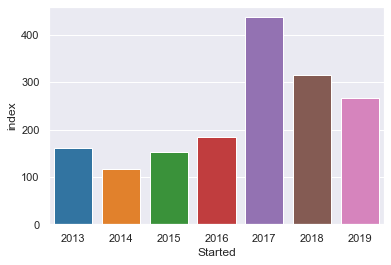

In [38]:
counts = data["Started"].apply(lambda x:x.year).reset_index().groupby("Started").count().reset_index()
print(sum(counts["index"]))
sns.barplot(x=counts.Started,y=counts["index"])

# Hypothesis 1: Start Month is correlated with number of fires and summer months are going to have the most fires

### Initial Visualization

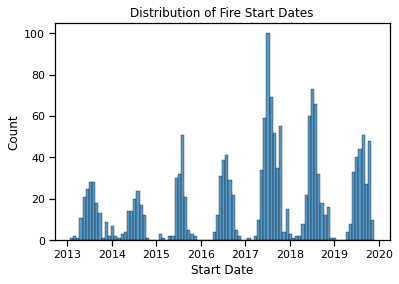

In [12]:
def plot_hypothesis1_initial():
    #We need to be able to compare dates!
    sns.set_context("notebook")
    ax = sns.histplot(data["Started"],bins=96)
    plt.xlabel("Start Date")
    plt.title("Distribution of Fire Start Dates");
    return
plot_hypothesis1_initial()

### As we've seen, there are many fires during the summer months. Interestingly enough, we also see that the overal number of fires is increasing as time goes on. Global Warming, am I right?

### This visualization isn't as optimal as we can't see exact counts with a tooltip. Let's try to implement this


In [13]:
alt.Chart(data,title="Distribution of Fire Start Dates").mark_bar(size=3).encode(
      alt.X("Started",timeUnit="year"),
    y='count()',
    tooltip=["Started"]
  )

alt.Chart(...)

### Hmm. That's not quite correct either. It doesn't seem to be counting all the fires that start each month. Also our tooltip isn't that useful because it only displays one specific date. Let's fix this. 

In [14]:
alt.Chart(data,title="Distribution of Fire Start Dates").mark_bar(size=5).encode(
      alt.X("Started:T",timeUnit="yearmonth"),
    y='count(*):Q',
    tooltip=[alt.Tooltip("YearMonth",title="Month and Year"),alt.Tooltip("count()",title="Number of Fires")]
  ).interactive()

alt.Chart(...)

### There we go. This looks better. And our tooltip is useful!

# Hypothesis 2: Counties in Southern California will have the majority of Fires

### Initial Visualization

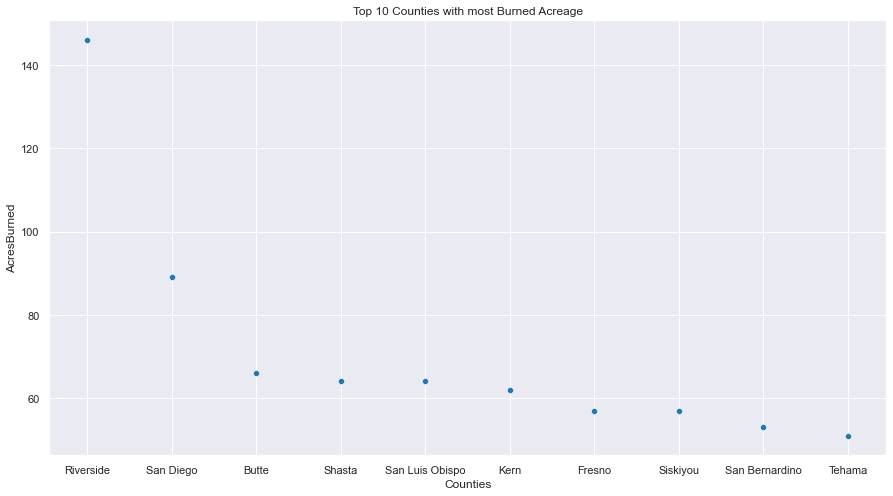

In [15]:
def plot_hypothesis2():
    plt.figure(figsize=(15,8))
    sns.set_style("darkgrid")
    by_county = data.groupby("Counties").count()["AcresBurned"].sort_values(ascending=False).reset_index()
    ax = sns.scatterplot(x="Counties",y="AcresBurned",data=by_county[0:10])
    plt.title("Top 10 Counties with most Burned Acreage");
    return
plot_hypothesis2()

## It seems our second hypothesis is correct. There are other Central Californian counties that also seem to have a lot of fires, but not compared to our first two, Riverside and San Diego. 

## Let's try to see generally where the fires happened

In [16]:
CA_bounds = [data.Longitude.min(),data.Longitude.max(),data.Latitude.min(),data.Latitude.max()]
CA_bounds

[-124.19629, -114.57265, 32.557546, 41.999341]

In [17]:
CA = plt.imread('map.png')

In [18]:
def plot_map(region,bounds,data,title,annotate=True):
    fig,ax = plt.subplots(figsize=(20,15))
    sns.scatterplot(x=data.Longitude,y=data.Latitude,hue=data.ArchiveYear,palette="hls",alpha=1,c="r",s=40)
    ax.set_title(title,fontsize=20)
    ax.set_xlim(bounds[0],bounds[1])
    ax.set_ylim(bounds[2],bounds[3])
    plt.axis('off')
    if annotate:
        for i, txt in enumerate(data.ArchiveYear):
            ax.annotate(txt, (data.Longitude[i], data.Latitude[i]),clip_on=True,fontsize = 13)
    ax.imshow(region,extent=bounds);
    return

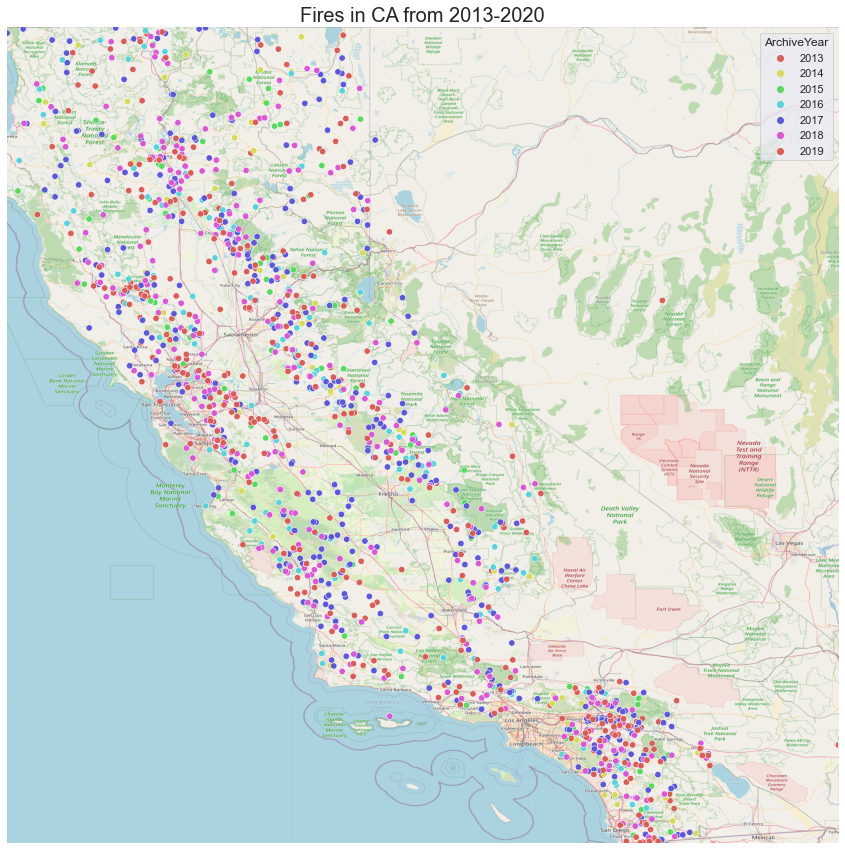

In [19]:
plot_map(CA,CA_bounds,data,"Fires in CA from 2013-2020",annotate=False)

### Final Visualization

In [20]:
from vega_datasets import data as d
background = alt.Chart(alt.topo_feature(d.us_10m.url, feature='states')).mark_geoshape(
    fill='lightgray',
    stroke='white'
).project('albersUsa').properties(
    width=500,
    height=300
)

In [21]:
fires = alt.Chart(data,title="Fires in CA from 2013-2020").mark_circle().encode(
    longitude='Longitude:Q',
    latitude='Latitude:Q',
    size=alt.value(10),
    tooltip=['Counties',"Started"]
).project(
    "albersUsa"
).properties(
    width=500,
    height=400
)

In [22]:
background+fires

alt.LayerChart(...)

### Future Directions: Make a CA projection so we can see the data better

# Hypothesis 3: The average acreage burned is <35K

### Initial Visualization

Median Fire Size(Acres): 100.0


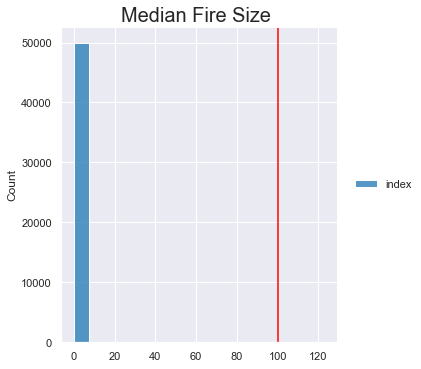

In [23]:
def plot_hypothesis3():
    binned=pd.cut(data.AcresBurned,50000).reset_index().groupby("AcresBurned").count()
    sns.displot(binned)
    plt.axvline(data.AcresBurned.median(),c="red")
    print("Median Fire Size(Acres): "+ str(data.AcresBurned.median()))
    plt.title("Median Fire Size ",fontsize=20);
    return
plot_hypothesis3()

## The median fire is 100 acres (on the dot wow)

### Final Visualization

In [24]:
median_fire=alt.Chart(data,title="Median Fire Size").mark_bar().encode(
    alt.X("AcresBurned",bin=True,scale=alt.Scale(type='sqrt')),
    alt.Y("count()",scale=alt.Scale(type='sqrt'),title="Number of Fires"),
    tooltip=alt.Tooltip("count()",title="Number of Fires")
).interactive()

rule = alt.Chart(data).mark_rule(color='red').encode(
    x='median(AcresBurned)',
    tooltip="median(AcresBurned)"
)
print("Median Fire Size(Acres): "+str(data.AcresBurned.median()))
median_fire+rule


Median Fire Size(Acres): 100.0


alt.LayerChart(...)